In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
import os
from scipy.stats import entropy

In [2]:
def create_model():  # Sólo se ejecuta una vez
    # Leer imágenes
    img_toalla = cv2.imread('fondo_toalla.jpeg')
    img_carpal = cv2.imread('fondo_carne_paleta.png')

    percentage = 0.10
    # Vectorizarlas
    nrows, ncols, nch = img_toalla.shape
    Xtoalla = np.reshape(img_toalla, (nrows*ncols, 3))

    ntoalla = len(Xtoalla)
    idx = np.random.permutation(ntoalla)[:int(ntoalla*percentage)]
    Xtoalla = Xtoalla[idx, :]

    Ytoalla = np.ones(int(ntoalla*percentage))

    nrows, ncols, nch = img_carpal.shape
    Xcarpal = np.reshape(img_carpal, (nrows*ncols, 3))

    ncarpal = len(Xcarpal)
    idx = np.random.permutation(ncarpal)[:int(ncarpal*percentage)]
    Xcarpal = Xcarpal[idx, :]

    Ycarpal = np.zeros(int(ncarpal*percentage))

    # Valores de entrenamiento
    X = np.concatenate((Xtoalla, Xcarpal), axis=0)
    Y = np.concatenate((Ytoalla, Ycarpal), axis=0)

    # Generar el clasificador de color
    model = RandomForestClassifier()
    model.fit(X, Y)
    return model


In [3]:
kernel = np.ones((29, 29), np.uint8)


def detectRectangles(img_rgb, mask,file_path=None):
    # gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # blurred = cv2.GaussianBlur(gray, (19, 19), 0)

    # ret, thresh = cv2.threshold(blurred, 140, 255, cv2.THRESH_BINARY)

    # erode = cv2.morphologyEx(thresh, cv2.MORPH_ERODE, kernel, iterations=5)

    # dilate = cv2.morphologyEx(erode, cv2.MORPH_DILATE, kernel, iterations=5)



    countours, hierarchy = cv2.findContours(
        mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    rectangles = [cv2.boundingRect(countour) for countour in countours]
    copy = img_rgb.copy()

    idx = 0
    max_entropy = 0
    paleta = None

    for rect in rectangles:
        # Skip the first rectangle because it is the whole image
        if idx == 0:
            idx += 1
            continue

        if rect[2] > 50 and rect[3] > 50:
            img_rgbn = img_rgb[rect[1]:rect[1]+rect[3], rect[0]:rect[0]+rect[2]]
            imgn_h = cv2.cvtColor(img_rgbn,cv2.COLOR_RGB2HSV)[:,:,0].flatten()
            imgn_s = cv2.cvtColor(img_rgbn,cv2.COLOR_RGB2HSV)[:,:,1].flatten()
            imgn_v = cv2.cvtColor(img_rgbn,cv2.COLOR_RGB2HSV)[:,:,2].flatten()

            imgn_h = imgn_h[np.logical_and(imgn_s > 100,imgn_v > 100)]
            hue_hist = np.histogram(imgn_h,bins=10,range=[0,180])[0]

            # print(hue_hist)
            # print(np.sum(hue_hist))
            hue_hist = hue_hist / np.sum(hue_hist)

            myentropy = entropy(hue_hist)
            if  myentropy > max_entropy:
                max_entropy = myentropy
                paleta = img_rgbn


            # plt.figure(figsize=(10, 10))

            # plt.subplot(1, 3, 1)
            # plt.title("Region Of Interest")
            # plt.imshow(img_rgbn)

            # plt.show()

            cv2.rectangle(
                copy, (rect[0], rect[1]), (rect[0] + rect[2], rect[1] + rect[3]), (255, 0, 0), 5)

        idx += 1

    if file_path is not None:
        cv2.imwrite(file_path,cv2.cvtColor(paleta,cv2.COLOR_RGB2BGR))

    return copy


In [4]:
def algorithm(img_path,file_path=None):  
  # Leer la imagen y redimensionarla al 30%
  img = cv2.imread(img_path,cv2.IMREAD_COLOR)
  h,w = img.shape[0:2]
  img = cv2.resize(img,(int(w*0.3),int(h*0.3)))
  img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
  
  # Vectorizar la imagen
  nrows,ncols,nch = img.shape
  Ximg = np.reshape(img,(nrows*ncols,3))
  
  # Obtener las salidas del clasificador
  yimg = model.predict(Ximg) # Nota: debe ser imagen BGR
  yimg = np.reshape(yimg,(nrows,ncols))
  yimg = yimg*255
  
  # Pasarlo a entero
  yimg = yimg.astype("uint8")
  
  # Mostrar la mascara
#   plt.figure()
#   plt.imshow(yimg,cmap="gray")
#   plt.show()
  
  # Reducir el ruido a la imagen
  ker = np.ones((5, 5), np.uint8)
  mask = cv2.morphologyEx(yimg, cv2.MORPH_DILATE, ker)
  ker = np.ones((25, 25), np.uint8)
  mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, ker)
  
  # Mostrar la nueva mascara
#   plt.figure()
#   plt.imshow(mask,cmap="gray")
#   plt.show()
  
  # Detectar rectangulos
  return detectRectangles(img_rgb,mask,file_path=file_path)


## Ejecucion

In [5]:
# Obtener el modelo de clasificacion
model = create_model()

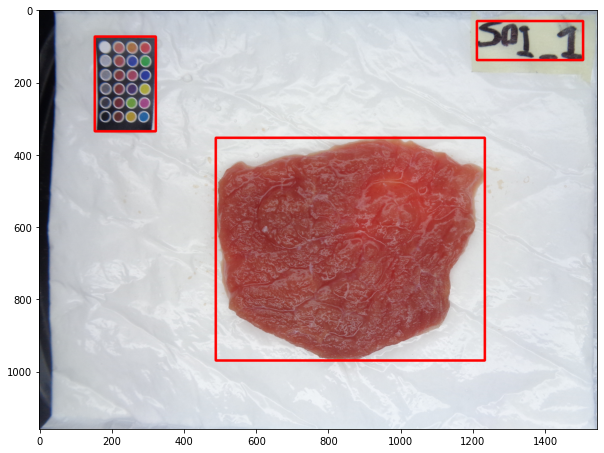

In [6]:

img_path = "fotos_carne/fotos_sirloin/20210906_S01_1_c.JPG"
# Ejecutar el proceso de enmascaramiento y deteccion de rectangulos
new_img = algorithm(img_path)

# Mostrar el resultado
plt.figure(figsize=(10, 10))
plt.imshow(new_img)
plt.show()

fotos_arrachera
20210830_A01_10_c.JPG


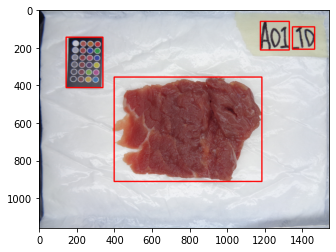

20210830_A01_1_c.JPG


<ipython-input-3-81582d722f81>:43: RuntimeWarning: invalid value encountered in true_divide
  hue_hist = hue_hist / np.sum(hue_hist)


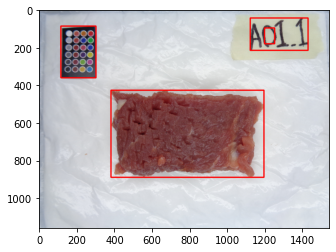

20210830_A01_2_c.JPG


<ipython-input-3-81582d722f81>:43: RuntimeWarning: invalid value encountered in true_divide
  hue_hist = hue_hist / np.sum(hue_hist)


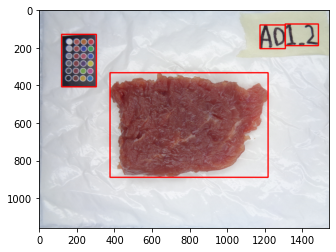

20210830_A01_3_c.JPG


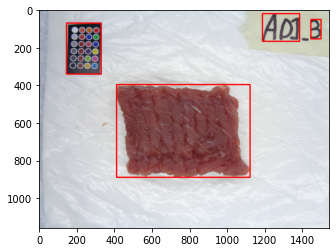

20210830_A01_4_c.JPG


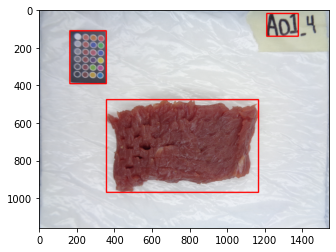

20210830_A01_5_c.JPG


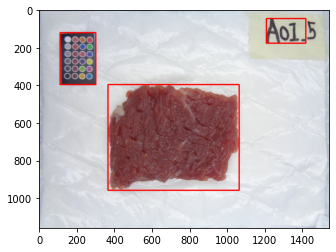

20210830_A01_6_c.JPG


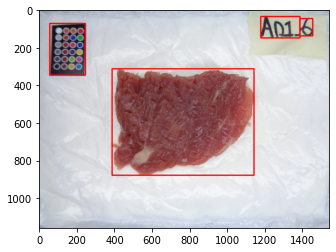

20210830_A01_7_c.JPG


<ipython-input-3-81582d722f81>:43: RuntimeWarning: invalid value encountered in true_divide
  hue_hist = hue_hist / np.sum(hue_hist)


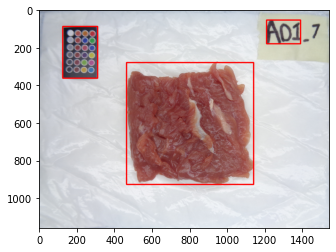

20210830_A01_8_c.JPG


<ipython-input-3-81582d722f81>:43: RuntimeWarning: invalid value encountered in true_divide
  hue_hist = hue_hist / np.sum(hue_hist)


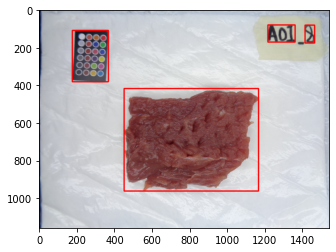

20210830_A01_9_c.JPG


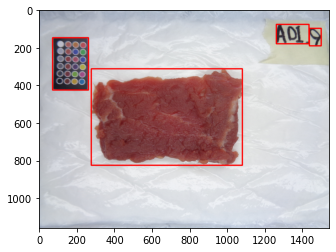

20210901_A01_10_c.JPG


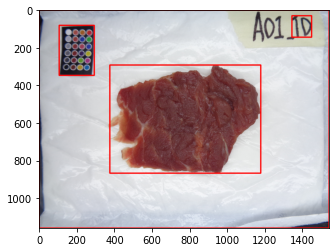

20210901_A01_1_c.JPG


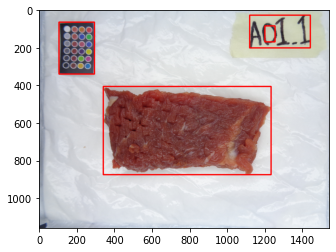

20210901_A01_2_c.JPG


<ipython-input-3-81582d722f81>:43: RuntimeWarning: invalid value encountered in true_divide
  hue_hist = hue_hist / np.sum(hue_hist)


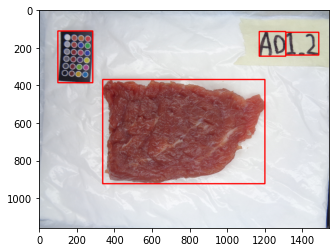

20210901_A01_3_c.JPG


<ipython-input-3-81582d722f81>:43: RuntimeWarning: invalid value encountered in true_divide
  hue_hist = hue_hist / np.sum(hue_hist)


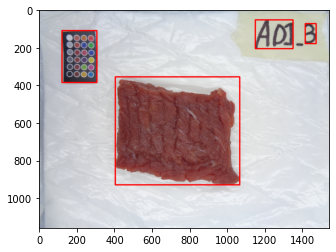

20210901_A01_4_c.JPG


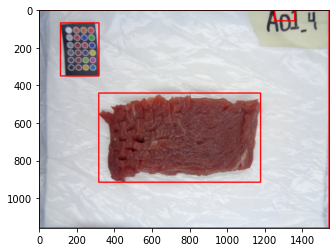

20210901_A01_5_c.JPG


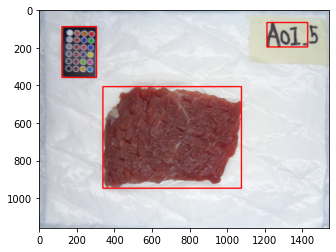

20210901_A01_6_c.JPG


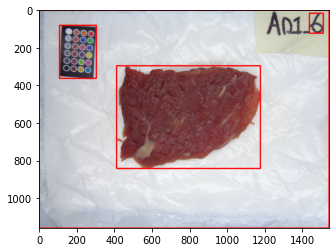

20210901_A01_7_c.JPG


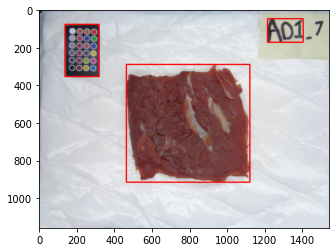

20210901_A01_8_c.JPG


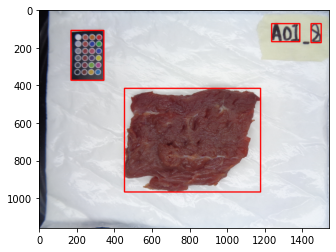

20210901_A01_9_c.JPG


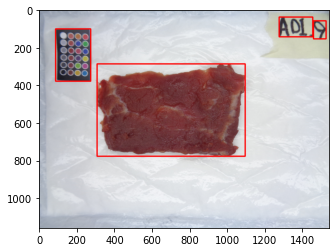

20210903_A01_10_c.JPG


<ipython-input-3-81582d722f81>:43: RuntimeWarning: invalid value encountered in true_divide
  hue_hist = hue_hist / np.sum(hue_hist)


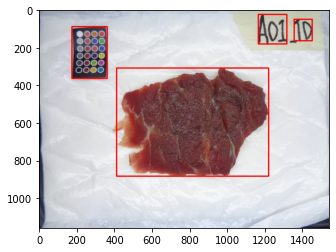

20210903_A01_1_c.JPG


<ipython-input-3-81582d722f81>:43: RuntimeWarning: invalid value encountered in true_divide
  hue_hist = hue_hist / np.sum(hue_hist)


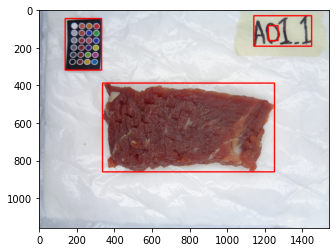

20210903_A01_2_c.JPG


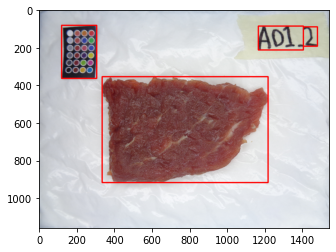

20210903_A01_3_c.JPG


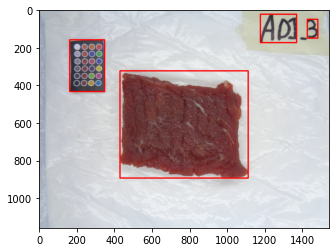

20210903_A01_4_c.JPG


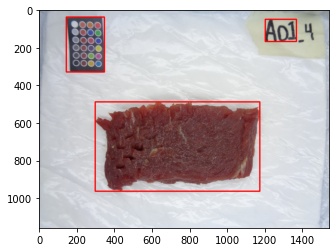

20210903_A01_5_c.JPG


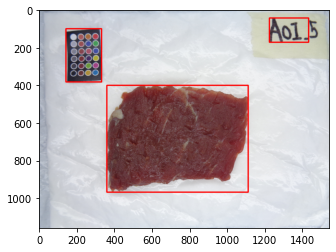

20210903_A01_6_c.JPG


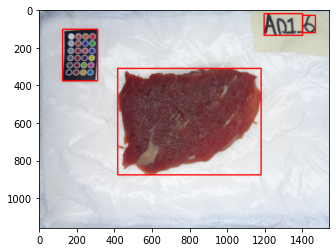

20210903_A01_7_c.JPG


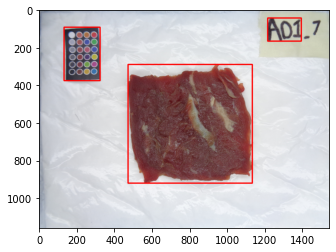

20210903_A01_8_c.JPG


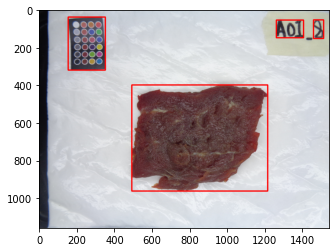

20210903_A01_9_c.JPG


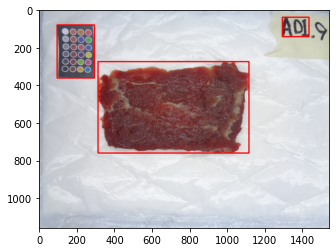

fotos_bola
20210913_B01_10_c.JPG


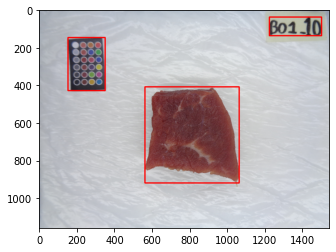

20210913_B01_1_c.jpg


<ipython-input-3-81582d722f81>:43: RuntimeWarning: invalid value encountered in true_divide
  hue_hist = hue_hist / np.sum(hue_hist)


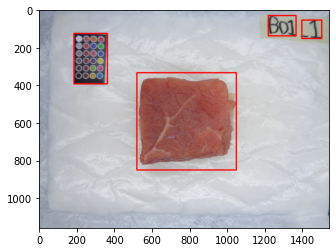

20210913_B01_2_c.JPG


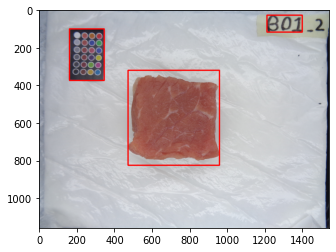

20210913_B01_3_c.JPG


<ipython-input-3-81582d722f81>:43: RuntimeWarning: invalid value encountered in true_divide
  hue_hist = hue_hist / np.sum(hue_hist)


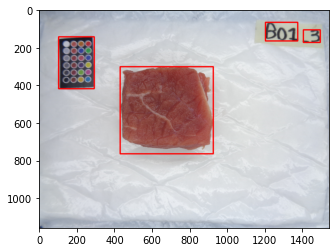

20210913_B01_4_c.JPG


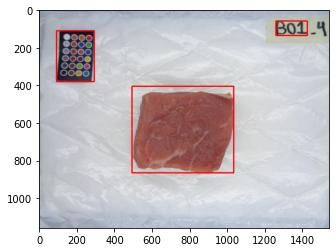

20210913_B01_5_c.JPG


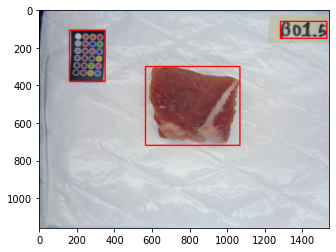

20210913_B01_6_c.JPG


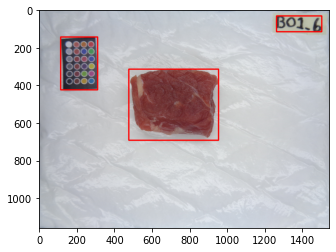

20210913_B01_7_c.JPG


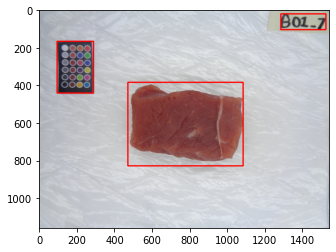

20210913_B01_8_c.JPG


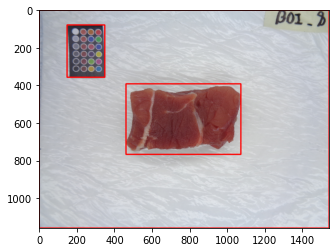

20210913_B01_9_c.JPG


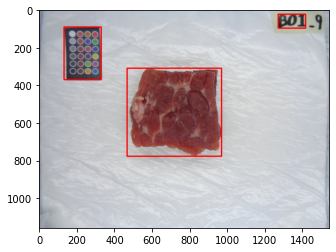

20210915_B01_10_c.JPG


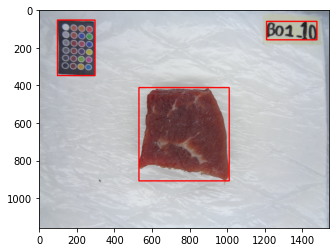

20210915_B01_1_c.JPG


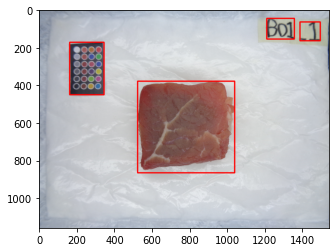

20210915_B01_2_c.JPG


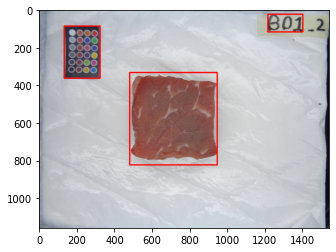

20210915_B01_3_c.JPG


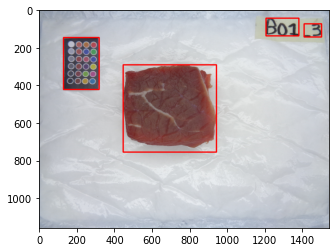

20210915_B01_4_c.JPG


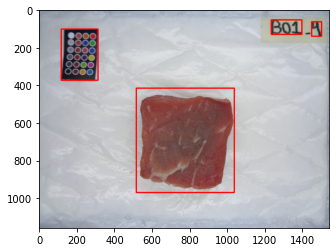

20210915_B01_5_c.JPG


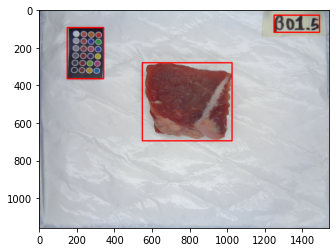

20210915_B01_6_c.JPG


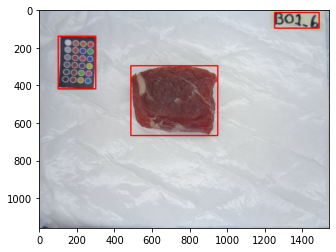

20210915_B01_7_c.JPG


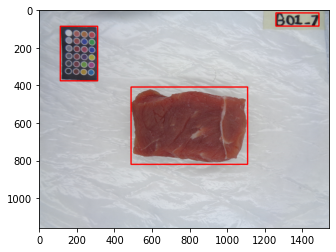

20210915_B01_8_c.JPG


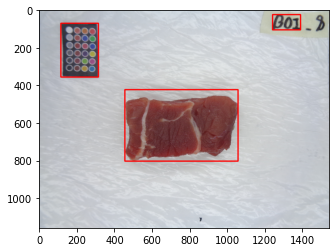

20210915_B01_9_c.JPG


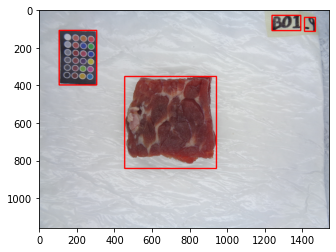

20210917_B01_10_c.JPG


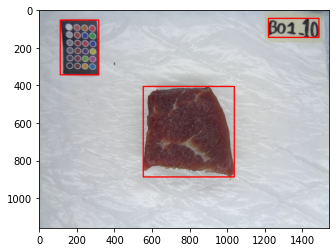

20210917_B01_1_c.JPG


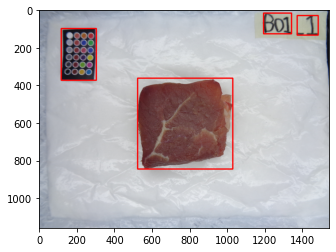

20210917_B01_2_c.JPG


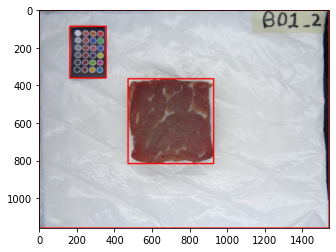

20210917_B01_3_c.JPG


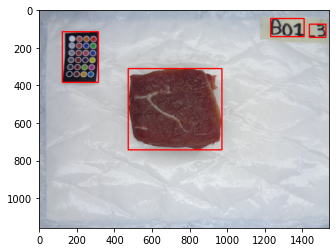

20210917_B01_4_c.JPG


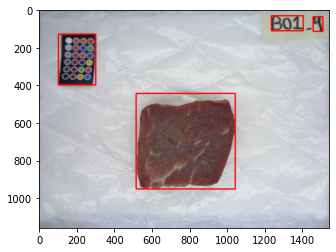

20210917_B01_5_c.JPG


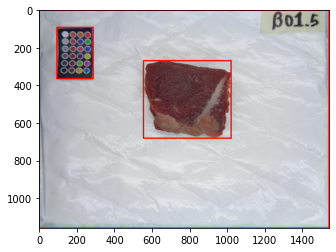

20210917_B01_6_c.JPG


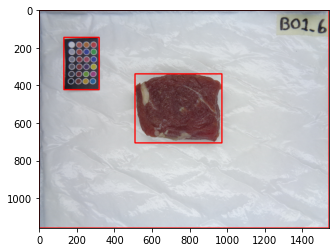

20210917_B01_7_c.JPG


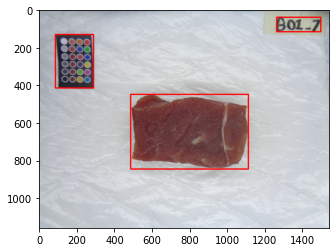

20210917_B01_8_c.JPG


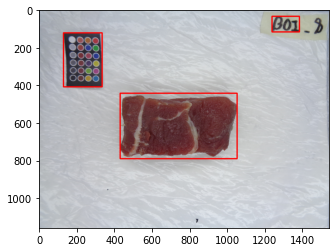

20210917_B01_9_c.JPG


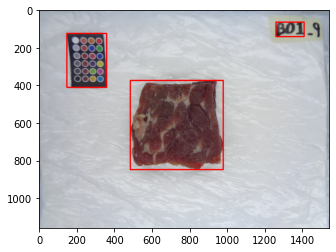

fotos_sirloin
20210906_S01_10_c.JPG


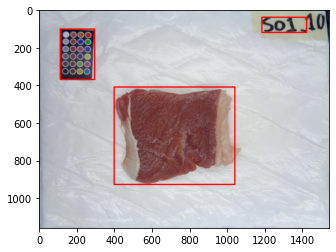

20210906_S01_1_c.JPG


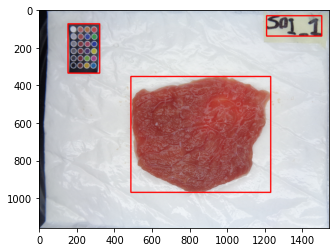

20210906_S01_2_c.JPG


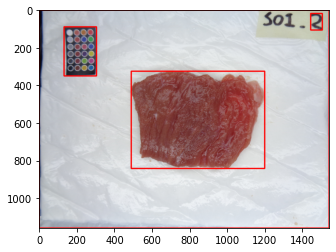

20210906_S01_3_c.JPG


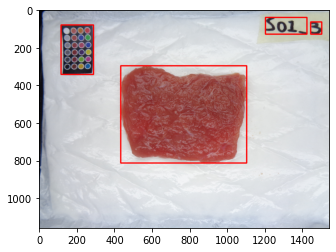

20210906_S01_4_c.JPG


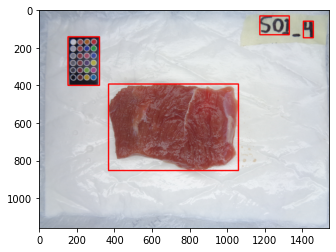

20210906_S01_5_c.JPG


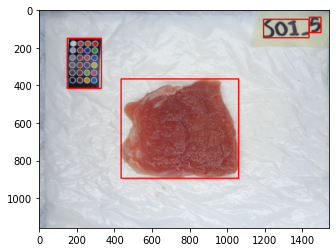

20210906_S01_6_c.JPG


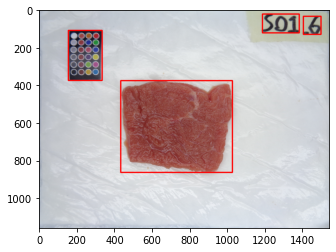

20210906_S01_7_c.JPG


<ipython-input-3-81582d722f81>:43: RuntimeWarning: invalid value encountered in true_divide
  hue_hist = hue_hist / np.sum(hue_hist)


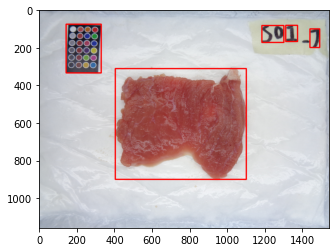

20210906_S01_8_c.JPG


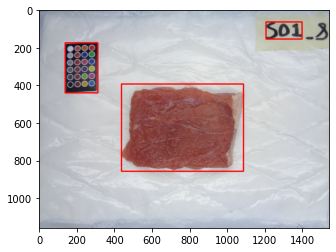

20210906_S01_9_c.JPG


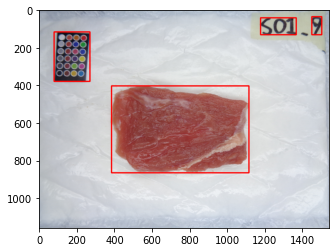

20210908_S01_10_c.JPG


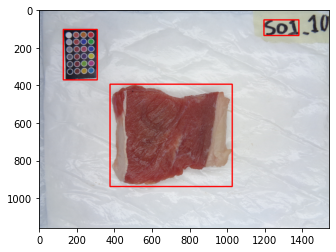

20210908_S01_1_c.JPG


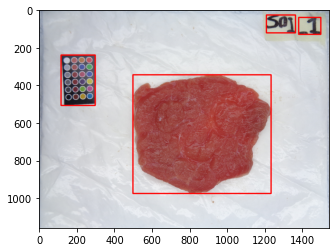

20210908_S01_2_c.JPG


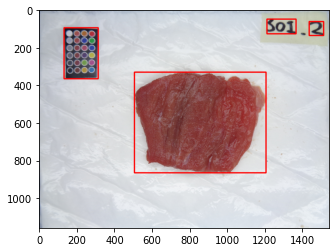

20210908_S01_3_c.JPG


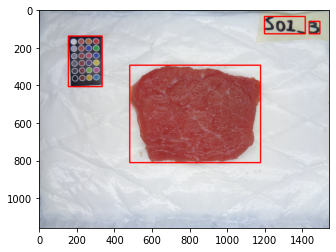

20210908_S01_4_c.JPG


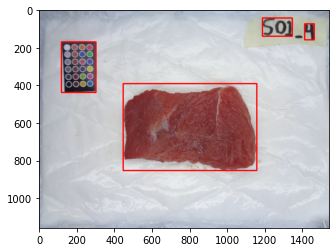

20210908_S01_5_c.JPG


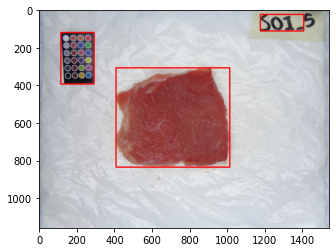

20210908_S01_6_c.JPG


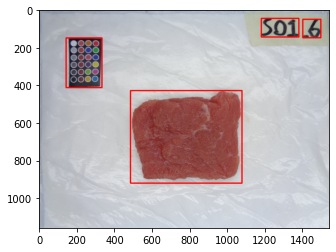

20210908_S01_7_c.JPG


<ipython-input-3-81582d722f81>:43: RuntimeWarning: invalid value encountered in true_divide
  hue_hist = hue_hist / np.sum(hue_hist)


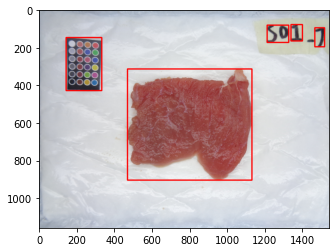

20210908_S01_8_c.JPG


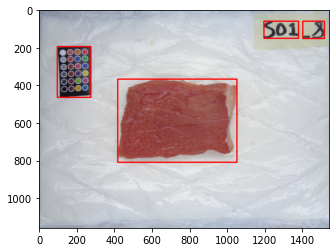

20210908_S01_9_c.JPG


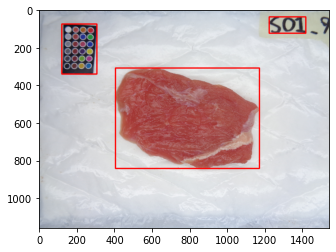

20210910_S01_10_c.JPG


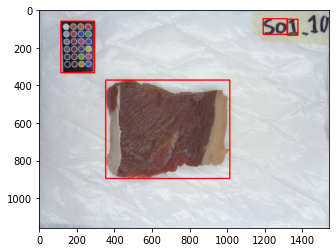

20210910_S01_1_c.JPG


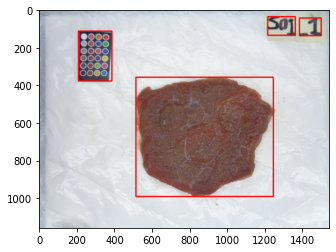

20210910_S01_2_c.JPG


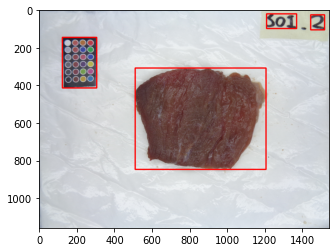

20210910_S01_3_c.JPG


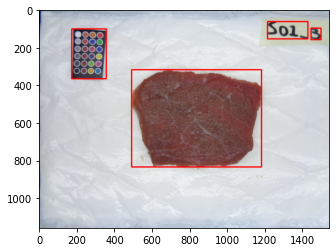

20210910_S01_4_c.JPG


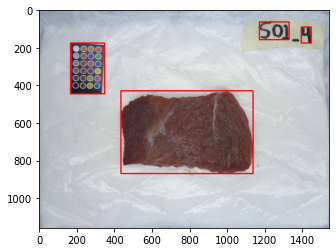

20210910_S01_5_c.JPG


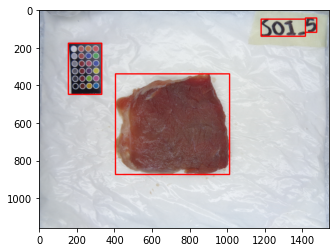

20210910_S01_6_c.JPG


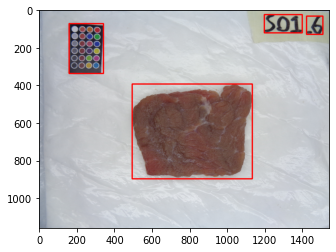

20210910_S01_7_c.JPG


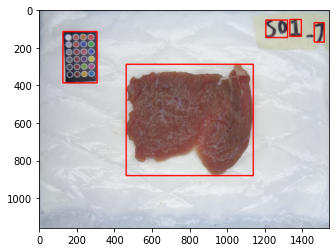

20210910_S01_8_c.JPG


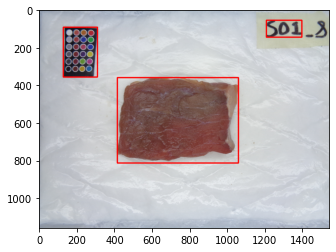

20210910_S01_9_c.JPG


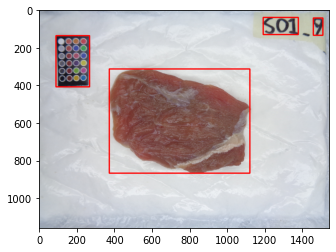

In [8]:
path = "fotos_carne"
subfolders = os.scandir(path)

for subfolder in subfolders:
    print(subfolder.name)

    with os.scandir(path+'/'+subfolder.name) as entries:
        for entry in entries:
            if entry.is_file():
                print(entry.name)

                # Ejecutar el proceso de enmascaramiento y deteccion de rectangulos
                new_img = algorithm(path+'/'+subfolder.name+'/'+entry.name,"resultados/"+subfolder.name+'/'+entry.name)

                # Mostrar el resultado
                plt.figure()
                plt.imshow(new_img)
                plt.show()

                # break

    # break


                